<a href="https://colab.research.google.com/github/FarrahBashirr/silver-memory/blob/main/ThesisProjectFinal.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Predicting mood from song lyrics using machine learning techniques.



## The main aim behind this study

We need to perform sentiment analysis on song lyrics in order to predict the mood of the song according to what is being said in the song itself not taking into consideration any of the following factors: Acousticness, Danceability, Energy, Instumentalness, Liveness, Loudness, Speechiness, Valence, and Tempo. 

What our model will target is only basing the mood or the tone of the song according to the lyrics of the song.

## Dataset Description

The dataset consists of song names, lyrics, along with the artists and the song moods ranging from year 2002 uptil year 2020.

<br>

<b>Description of Dataset Columns:</b>

- <b>Artist:</b> The artist's name.
- <b>Title:</b> The song's name or title.
- <b>Album:</b> The name of the album which the song belongs to.
- <b>Year:</b> The year that the song was released in.
- <b>Lyrics:</b> The lyrics of the song.
- <b>Date:</b> The exact date that the song was released in.
- <b>Mood:</b> Describes the tone of the song which is either 'Happy', 'Sad', 'Energetic', 'Calm', and 'Angry'. 


## Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import wordcloud as wc
import string
import re

import nltk
from nltk import TreebankWordTokenizer
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk import ngrams
from bs4 import BeautifulSoup


%matplotlib inline
plt.style.use('fivethirtyeight')
sns.set_style('whitegrid')

df = pd.read_csv('https://raw.githubusercontent.com/FarrahBashirr/silver-memory/main/Dataset.csv')

df.head(5)


,Artist,Title,Album,Year,Lyrics,Date,Mood
0,Ariana Grande,"thank u, next","thank u, next",2018.0,thought i'd end up with sean but he wasn't a m...,03/11/2018,Happy
1,Ariana Grande,7 rings,"thank u, next",2019.0,yeah breakfast at tiffany's and bottles of bub...,18/01/2019,Sad
2,Ariana Grande,God is a woman,Sweetener,2018.0,you you love it how i move you you love it how...,13/07/2018,Energetic
3,Ariana Grande,Side To Side,Dangerous Woman,2016.0,ariana grande nicki minaj i've been here all ...,20/05/2016,Calm
4,Ariana Grande,no tears left to cry,Sweetener,2018.0,right now i'm in a state of mind i wanna be in...,20/04/2018,Angry


## Data Inspection 

This step is done in order to inspect the dataset and visualize it to be able to understand the data that we're dealing with better. 

In [2]:
df.tail(5)

# Displaying the last 5 rows in the table.

,Artist,Title,Album,Year,Lyrics,Date,Mood
424,Lady Gaga,Telephone,The Fame Monster,2010.0,lady gaga hello hello baby you called i can't ...,26/01/2010,Energetic
425,Lady Gaga,Aura,ARTPOP,2013.0,i killed my former and left her in the trunk o...,06/11/2013,Sad
426,Lady Gaga,Babylon,Chromatica,2020.0,we only have the weekend you can serve it to m...,29/05/2020,Happy
427,Lady Gaga,Gypsy,ARTPOP,2013.0,sometimes a story has no end sometimes i think...,06/11/2013,Energetic
428,Lady Gaga,Paparazzi,The Fame,2009.0,we are the crowd we're ccomin' out got my flas...,06/07/2009,Energetic


In [3]:
df.columns

# Displays all the column names in the table.

Index(['Artist', 'Title', 'Album', 'Year', 'Lyrics', 'Date', 'Mood'], dtype='object')

In [4]:
df.shape

# Displays the number of rows and columns in the dataframe. 

(429, 7)

In [5]:
for column in df.columns:
    print(f"{column} : {df[column].unique()}")
    print("====================================")

# Displays the unique values in each column.

Artist : ['Ariana Grande' 'Beyonce' 'Coldplay' 'Cardi B' 'Drake' 'Maroon 5'
 'Rihanna' 'Eminem' 'Khalid' 'Selena Gomez' 'Billie Eilish' 'Charlie Puth'
 'Dua Lipa' 'Nicki Minaj' 'Lady Gaga']
Title : ['thank u, next' '7 rings' 'God is a woman' 'Side To Side'
 'no tears left to cry' 'breathin'
 'break up with your girlfriend, I am bored' 'positions' nan 'imagine'
 'needy' 'pov' 'ghostin' 'pete davidson' 'in my head' 'sweetener' 'R.E.M.'
 'NASA' 'Dangerous Woman' 'Let Me Love You' 'bloodline' 'Into You'
 'fake smile' 'goodnight n go' 'the light is coming' 'One Last Time'
 'bad idea' 'better off' 'make up' 'get well soon' 'The Way' 'Problem'
 'everytime' 'Focus' 'Everyday' 'Moonlight' 'just like magic'
 'raindrops (an angel cried)' 'nasty' 'successful' 'Be Alright'
 'safety net' 'shut up' 'obvious' 'my hair' 'love language' 'six thirty'
 'Break Free' 'My Everything' '34+35 ' 'Drunk in Love' 'Formation'
 'Partition' 'Mine' 'Hold Up' 'Flawless ' 'Sorry' 'If I Were a Boy'
 'Pray You Catch Me' 

In [6]:
for column in df.columns:
    print(f"{column}: Number of unique values {df[column].nunique()}")
    print("==========================================================")

# Displays the number of unique values in each column. 

Artist: Number of unique values 15
Title: Number of unique values 422
Album: Number of unique values 107
Year: Number of unique values 22
Lyrics: Number of unique values 429
Date: Number of unique values 242
Mood: Number of unique values 5


In [7]:
df.info()

# Displays all columns and their data types. 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 429 entries, 0 to 428
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Artist  429 non-null    object 
 1   Title   426 non-null    object 
 2   Album   408 non-null    object 
 3   Year    422 non-null    float64
 4   Lyrics  429 non-null    object 
 5   Date    422 non-null    object 
 6   Mood    429 non-null    object 
dtypes: float64(1), object(6)
memory usage: 23.6+ KB


In [8]:
df.describe()

# Displays the statistical summary of the columns with numeric values.

,Year
count,422.000000
mean,2014.635071
std,4.557837
min,1999.000000
25%,2013.000000
50%,2016.000000
75%,2018.000000
max,2021.000000


In [9]:
df.isnull().sum()

# Displays the number of null values under each column.

Artist     0
Title      3
Album     21
Year       7
Lyrics     0
Date       7
Mood       0
dtype: int64

In [10]:
df.isnull().sum()/ len(df)*100

# Displays the feature wise percentage of null values under each column.

Artist    0.000000
Title     0.699301
Album     4.895105
Year      1.631702
Lyrics    0.000000
Date      1.631702
Mood      0.000000
dtype: float64

## Data Cleaning

In [11]:
df= df.dropna()
df.isnull().sum()

# Is used to remove any missing values. 

Artist    0
Title     0
Album     0
Year      0
Lyrics    0
Date      0
Mood      0
dtype: int64

In [12]:
df.isnull().sum()/ len(df)*100

# Displays the feature wise percentage of null values under each column.

Artist    0.0
Title     0.0
Album     0.0
Year      0.0
Lyrics    0.0
Date      0.0
Mood      0.0
dtype: float64

In [13]:
df['Year'] = df['Year'].astype(int)

# The datatype of the Year has been changed from 'float' to 'int'.

<ipython-input-13-b58cdffea1f3>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = df['Year'].astype(int)


In [14]:
df.info()

# Displays all columns and their data types. 

<class 'pandas.core.frame.DataFrame'>
Int64Index: 401 entries, 0 to 428
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Artist  401 non-null    object
 1   Title   401 non-null    object
 2   Album   401 non-null    object
 3   Year    401 non-null    int64 
 4   Lyrics  401 non-null    object
 5   Date    401 non-null    object
 6   Mood    401 non-null    object
dtypes: int64(1), object(6)
memory usage: 25.1+ KB


In [15]:
categorical_columns = ['Mood']
df_encode = pd.get_dummies(data = df,
                           columns = categorical_columns,
                           drop_first = True,
                           dtype = 'int8')

# One Hot Encoding for 'Mood' column. 

## A better view of what we want to see

In [16]:
df_copy = df[['Lyrics', 'Mood']].copy()
df_copy

# This step only shows the two columns we'll be working on which are the 'Lyrics' column and the 'Mood' column. 

,Lyrics,Mood
0,thought i'd end up with sean but he wasn't a m...,Happy
1,yeah breakfast at tiffany's and bottles of bub...,Sad
2,you you love it how i move you you love it how...,Energetic
3,ariana grande nicki minaj i've been here all ...,Calm
4,right now i'm in a state of mind i wanna be in...,Angry
...,...,...
424,lady gaga hello hello baby you called i can't ...,Energetic
425,i killed my former and left her in the trunk o...,Sad
426,we only have the weekend you can serve it to m...,Happy
427,sometimes a story has no end sometimes i think...,Energetic


**Word Cloud**

The reason behind deploying word cloud is to visualize the trends and the lyrics better in order to reach an understanding of how it is going to be modelled. 

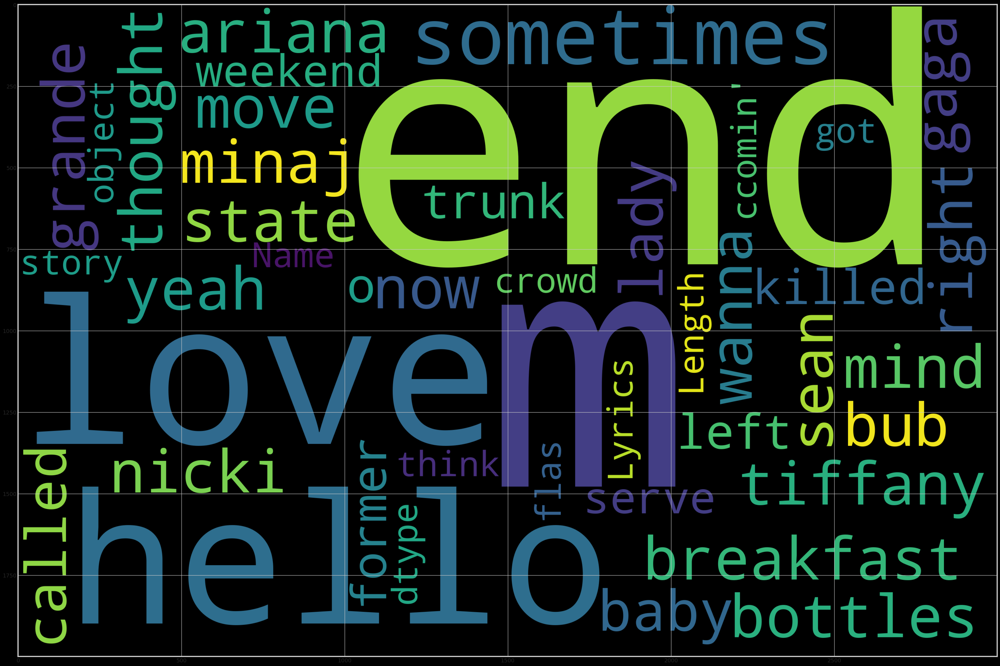

In [17]:
# !pip install wordcloud
# import wordcloud as wc

text = df_copy["Lyrics"]

wordcloud = wc.WordCloud(
    width = 3000,
    height = 2000,
    stopwords = wc.STOPWORDS).generate(str(text))

fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')

### Lowercase Conversion and Removing Digits

In [18]:
# import re

df_copy['Lyrics'] = df_copy['Lyrics'].apply(lambda review : re.sub(r"[0-9]", " ", review.lower()))
df_copy['Lyrics']

# This is done in order to lowercase the letter and remove any possible digits if there is. 

0      thought i'd end up with sean but he wasn't a m...
1      yeah breakfast at tiffany's and bottles of bub...
2      you you love it how i move you you love it how...
3      ariana grande  nicki minaj i've been here all ...
4      right now i'm in a state of mind i wanna be in...
                             ...                        
424    lady gaga hello hello baby you called i can't ...
425    i killed my former and left her in the trunk o...
426    we only have the weekend you can serve it to m...
427    sometimes a story has no end sometimes i think...
428    we are the crowd we're ccomin' out got my flas...
Name: Lyrics, Length: 401, dtype: object

### Tokenization

In [19]:
# !pip install nltk
# import nltk
# from nltk import TreebankWordTokenizer

tokenizer = TreebankWordTokenizer()

df_copy['Lyrics'] = df_copy['Lyrics'].apply(lambda review: tokenizer.tokenize(review))
df_copy['Lyrics']

# This step is done in order to split text into smaller units known as tokens (words, numbers, etc).
# It is also useful for separating phrase-terminating punctuation from adjacent tokens. 
# Example: Don't becomes ["do","n't"]

0      [thought, i, 'd, end, up, with, sean, but, he,...
1      [yeah, breakfast, at, tiffany, 's, and, bottle...
2      [you, you, love, it, how, i, move, you, you, l...
3      [ariana, grande, nicki, minaj, i, 've, been, h...
4      [right, now, i, 'm, in, a, state, of, mind, i,...
                             ...                        
424    [lady, gaga, hello, hello, baby, you, called, ...
425    [i, killed, my, former, and, left, her, in, th...
426    [we, only, have, the, weekend, you, can, serve...
427    [sometimes, a, story, has, no, end, sometimes,...
428    [we, are, the, crowd, we, 're, ccomin, ', out,...
Name: Lyrics, Length: 401, dtype: object

### Removing Stopwords

In [20]:
!pip install --upgrade nltk
nltk.download('stopwords')
from nltk.corpus import stopwords

stop_words = stopwords.words('english')
stop_words

# This step is done in order to view all the stop words in the lyrics that dont contribute to the overall meaning. 
# Examples include: "a", "the", "is", "are", "I", etc.

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [21]:
#negation_list = ["no","nor", "not", "n't"]

#stop_words = [word for word in stop_words if word not in negation_list]
#stop_words

# This step is done in order to pick out negations from the stopwords list so that they're not removed.
# Negations are needed for the performance of the prediction model. 

In [22]:
new_fillers = ["oh", "yeah", "ayy", "ooh", "yuh", "mmm", "00", "hmm", "mmmmmm", "ugh", "no", "â€", "Ã©", "dumdadeda", "yeehaw", "oohoohooh"]

stop_words = nltk.corpus.stopwords.words('english')
stop_words.extend(new_fillers)

stop_words

# This step is done to create a list that has all the lyrics fillers and adding them to the stopwords list in order to be removed so that they don't skew the model's performance. 
# Examples include: "oh", "hmm", "yeah".. etc. 

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [23]:
df_copy['Lyrics'] = df_copy['Lyrics'].apply(lambda review: [word for word in review if word not in stop_words])
df_copy['Lyrics'].tolist()

#This step is done to remove stopwords from "Lyrics" column.

[['thought',
  "'d",
  'end',
  'sean',
  "n't",
  'match',
  'wrote',
  'songs',
  'ricky',
  'listen',
  'laugh',
  'even',
  'almost',
  'got',
  'married',
  'pete',
  "'m",
  'thankful',
  'wish',
  'could',
  'say',
  'thank',
  'malcolm',
  "'cause",
  'angel',
  'pre',
  'one',
  'taught',
  'love',
  'one',
  'taught',
  'patience',
  'one',
  'taught',
  'pain',
  "'m",
  'amazing',
  'say',
  "'ve",
  'loved',
  "'ve",
  'lost',
  "'s",
  'see',
  'look',
  'got',
  'look',
  'taught',
  'say',
  'thank',
  'next',
  'next',
  'thank',
  'next',
  'next',
  'thank',
  'next',
  "'m",
  'fuckin',
  "'",
  'grateful',
  'ex',
  'thank',
  'next',
  'next',
  'thank',
  'next',
  'next',
  'thank',
  'next',
  'next',
  "'m",
  'fuckin',
  "'",
  'spend',
  'time',
  'friends',
  'ai',
  "n't",
  'worried',
  "'bout",
  'nothin',
  "'",
  'plus',
  'met',
  'someone',
  'else',
  'havin',
  "'",
  'better',
  'discussions',
  'know',
  'say',
  'move',
  'fast',
  'one',
  'gon

## Punctuation

In [24]:
# import string

df_copy['Lyrics'] = df_copy['Lyrics'].apply(lambda review : list(filter(None,[word.replace('.', '').replace('_','').replace('-','').replace("'","" ).replace("`","") for word in review if word not in string.punctuation])))

df_copy['Lyrics']

# This step is done in order to remove puncuations, dots, dashes, or empty strings.


0      [thought, d, end, sean, nt, match, wrote, song...
1      [breakfast, tiffany, s, bottles, bubbles, girl...
2      [love, move, love, touch, one, said, done, ll,...
3      [ariana, grande, nicki, minaj, ve, night, aria...
4      [right, m, state, mind, wan, na, like, time, a...
                             ...                        
424    [lady, gaga, hello, hello, baby, called, ca, n...
425    [killed, former, left, trunk, highway, put, kn...
426    [weekend, serve, ancientcity, style, party, li...
427    [sometimes, story, end, sometimes, think, coul...
428    [crowd, re, ccomin, got, flash, s, true, need,...
Name: Lyrics, Length: 401, dtype: object

## Lemmatization

***Natural Language Processing (NLP) Technqiues:***

**1) Sentiment Analysis**

It tends to dissect data in order to determine whether it's positive, negative, or neutral.

**2) Named Entity Recognition:**

It tags ‘named identities’ within text and extracts them for further analysis.
It simply tags the identities, whether they are organization names, people, proper nouns, locations, etc., and keeps a running tally of how many times they occur within a dataset.

**3) Text Summary:**

It breaks down jargon, whether scientific, medical, technical or other, into its most basic terms using natural language processing in order to make it more understandable.

**4) Topic Modelling:**

It's an unsupervised Natural Language Processing (NLP) technique. It analyzes documents to identify common themes and provide an adequate cluster. For example, a topic modeling algorithm could identify whether incoming documents are contracts, invoices, complaints, or more based on their contents. It tends to understand unstructued data without predefined tags or training data.

**5) Text Classification:**
Text classification takes your text dataset then structures it for further analysis. It is often used to mine helpful data from customer reviews as well as customer service slogs.
Topic Modelling, Keyword Extraction, and Sentiment Analysis are all subsets of Text Classification. 

**6) Keywrd Extraction:**

It is the automated process of extracting the most relevant information from text using AI and machine learning algorithms.

**7) Stemming and Lemmitization:**
Stemming is the process of extracting the root of the word. The root words doesn't need to carry a semantic meaning.

Lemmatization, which is the process extracting the base form of the word, namely Lemma, which has a semantic meaning. It works on removing the inflectional endings.




Out of all the above mentioned technqiues, **Lemmatization** will be the most useful technqiue in order to have more accurate results than **Stemming**. 

In [25]:
nltk.download('wordnet')
from nltk.stem import WordNetLemmatizer
  
lemmatizer = WordNetLemmatizer()

df_copy['Lyrics'] = df_copy['Lyrics'].apply(lambda review: [lemmatizer.lemmatize(word) for word in review])
df_copy['Lyrics']

# Applying the Lemmatization NLP technqiue to extract the lemma of the words.

[nltk_data] Downloading package wordnet to /root/nltk_data...


0      [thought, d, end, sean, nt, match, wrote, song...
1      [breakfast, tiffany, s, bottle, bubble, girl, ...
2      [love, move, love, touch, one, said, done, ll,...
3      [ariana, grande, nicki, minaj, ve, night, aria...
4      [right, m, state, mind, wan, na, like, time, a...
                             ...                        
424    [lady, gaga, hello, hello, baby, called, ca, n...
425    [killed, former, left, trunk, highway, put, kn...
426    [weekend, serve, ancientcity, style, party, li...
427    [sometimes, story, end, sometimes, think, coul...
428    [crowd, re, ccomin, got, flash, s, true, need,...
Name: Lyrics, Length: 401, dtype: object

## Data Preparation for Modelling

In [26]:
df_copy['Lyrics']= df_copy['Lyrics'].apply(lambda x : " ".join(x))

# This step is done in order to join all the lyrics in each song as one string.

*Splitting Data into Training and Testing*

In [27]:
from sklearn.model_selection import train_test_split

X = df_copy['Lyrics'] # Independent Variable
y = df_copy['Mood'] # Dependent Variable

x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [28]:
happy = x_train[y_train[y_train == 'Happy'].index]
sad = x_train[y_train[y_train == 'Sad'].index]
energetic = x_train[y_train[y_train == 'Energetic'].index]
calm = x_train[y_train[y_train == 'Calm'].index]
angry = x_train[y_train[y_train == 'Angry'].index]

# This step checks the frequency of words in each of the 5 song moods.

Using word cloud to show the frequency of words in each of the five moods deployed in the dataset. 

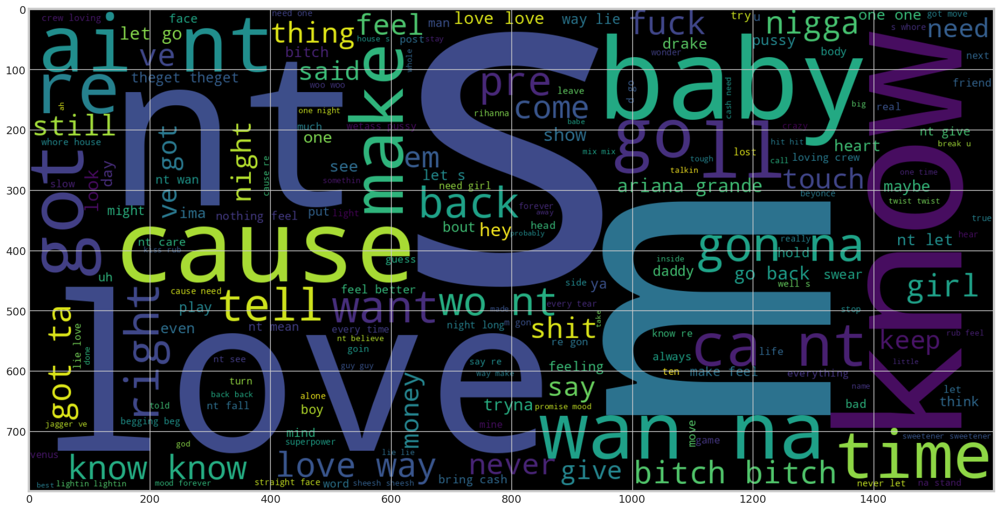

In [29]:
plt.figure(figsize = (20,20))

happy_mood = wc.WordCloud(min_font_size = 3 , width = 1600 , height = 800).generate(" ".join(happy))

plt.imshow(happy_mood,interpolation = 'bilinear')

# Songs with Happy mood.

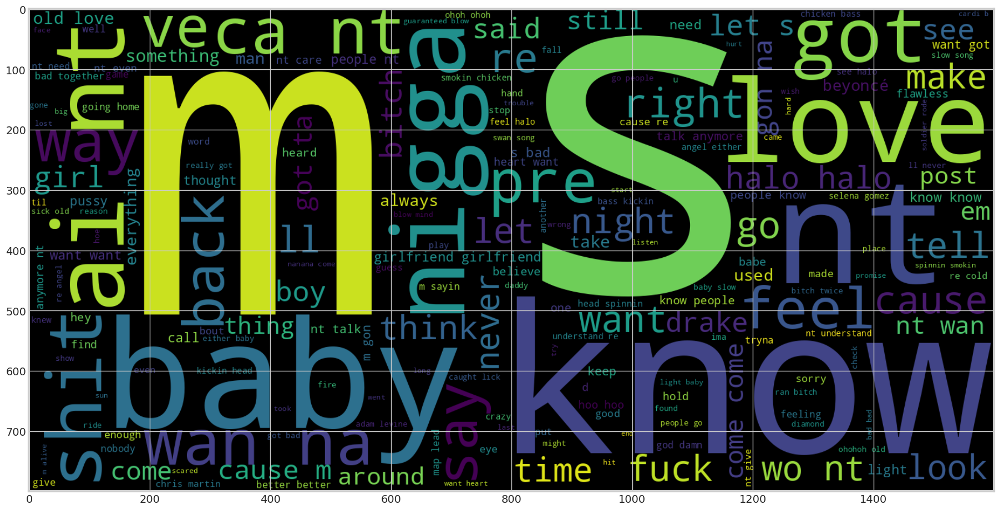

In [30]:
plt.figure(figsize = (20,20)) 

sad_mood = wc.WordCloud( min_font_size = 3 , width = 1600 , height = 800).generate(" ".join(sad))

plt.imshow(sad_mood,interpolation = 'bilinear')

# Songs with Sad mood

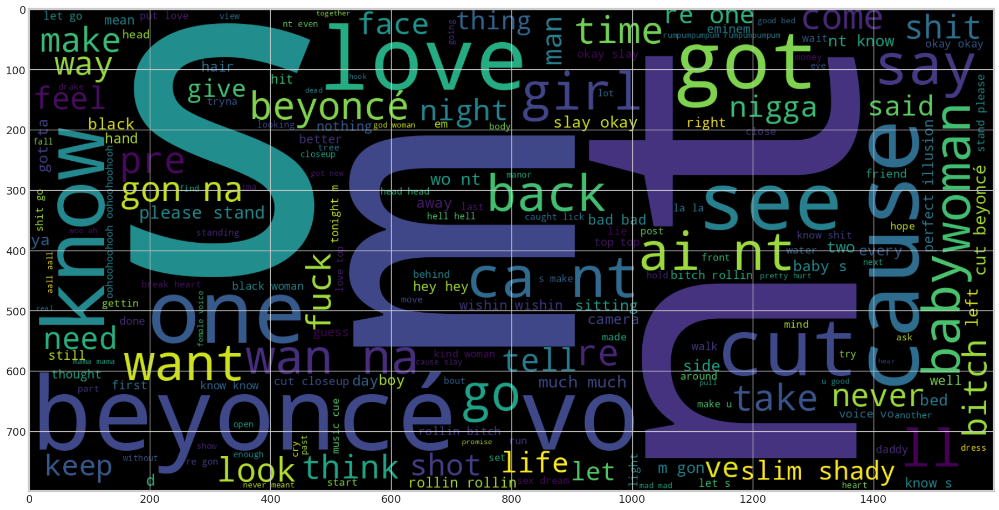

In [31]:
plt.figure(figsize = (20,20))

energetic_mood = wc.WordCloud(min_font_size = 3 , width = 1600 , height = 800).generate(" ".join(energetic))

plt.imshow(energetic_mood,interpolation = 'bilinear')

# Songs with Energetic mood.

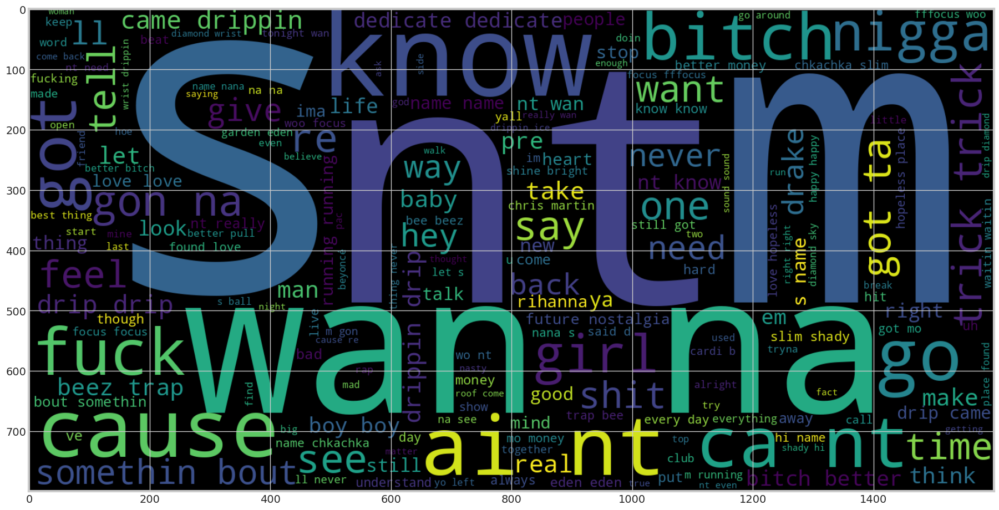

In [32]:
plt.figure(figsize = (20,20))

calm_mood = wc.WordCloud(min_font_size = 3 , width = 1600 , height = 800).generate(" ".join(calm))

plt.imshow(calm_mood,interpolation = 'bilinear')

# Songs with Calm mood.

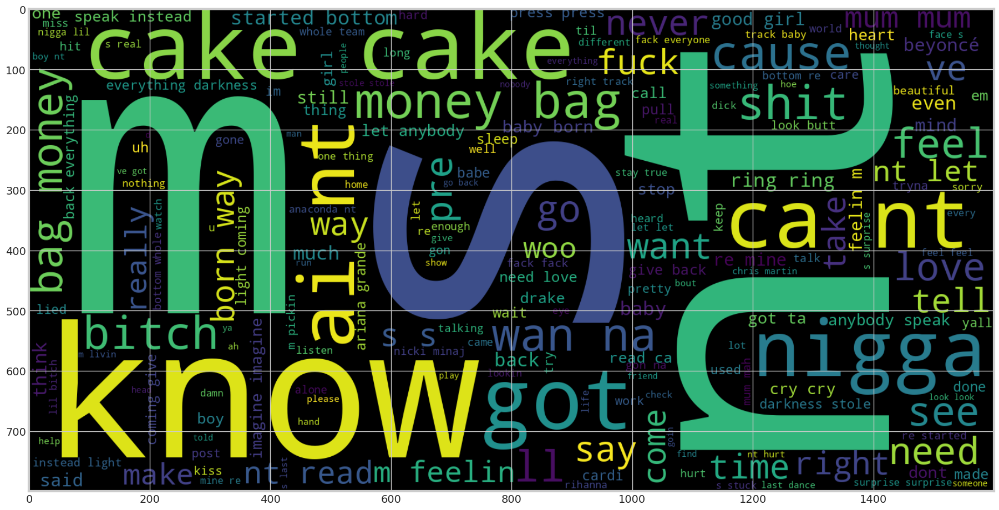

In [33]:
plt.figure(figsize = (20,20))

angry_mood = wc.WordCloud(min_font_size = 3 , width = 1600 , height = 800).generate(" ".join(angry))

plt.imshow(angry_mood,interpolation = 'bilinear')

# Songs with Angry mood.

#### N-grams

N-grams are used in order to decide which N-grams can be chunked or set together in order to form single entities. It is also useful when making next word predictions, and finally, it can help when it comes to spelling error corrections. 

In [34]:
from nltk import ngrams

n_grams_happy = pd.Series(ngrams(" ".join(happy).split(), 3)).value_counts()[:20]
n_grams_sad = pd.Series(ngrams(" ".join(sad).split(), 3)).value_counts()[:20]
n_grams_energetic = pd.Series(ngrams(" ".join(energetic).split(), 3)).value_counts()[:20]
n_grams_calm = pd.Series(ngrams(" ".join(calm).split(), 3)).value_counts()[:20]
n_grams_angry = pd.Series(ngrams(" ".join(angry).split(), 3)).value_counts()[:20]


Text(0.5, 0, 'No. of Occurances')

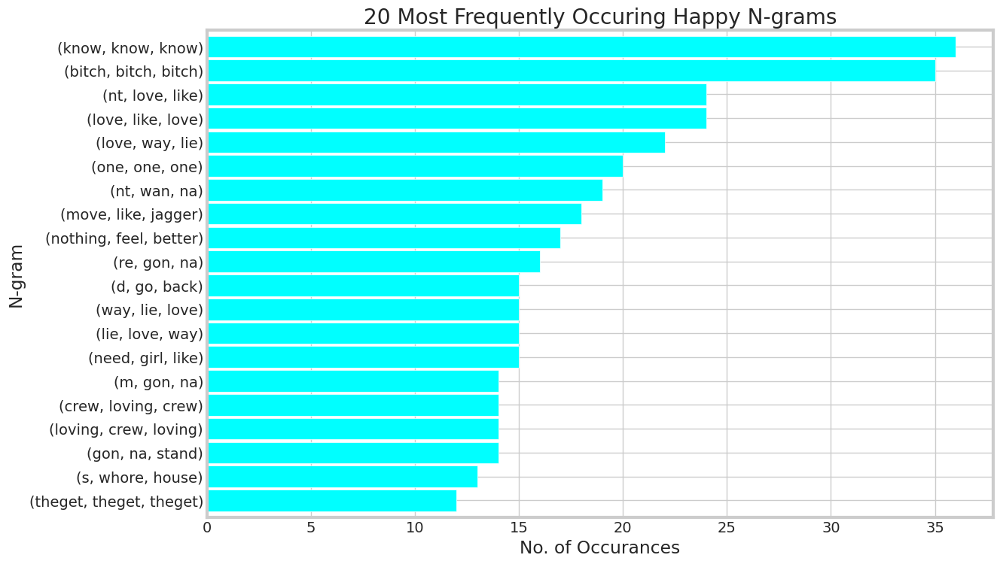

In [35]:
n_grams_happy.sort_values().plot.barh(color='cyan', width=.9, figsize=(12, 8))
plt.title('20 Most Frequently Occuring Happy N-grams')
plt.ylabel('N-gram')
plt.xlabel('No. of Occurances')

Text(0.5, 0, 'No. of Occurances')

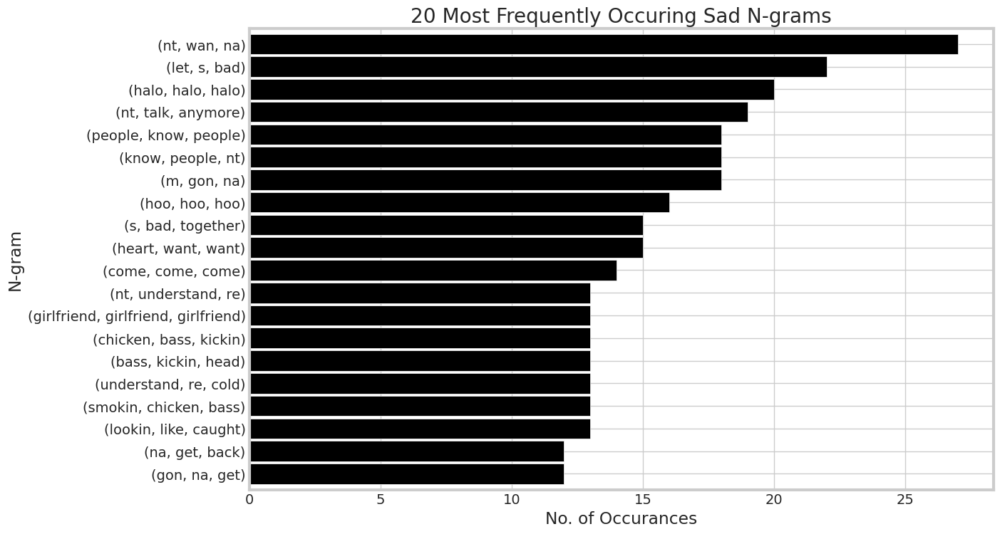

In [36]:
n_grams_sad.sort_values().plot.barh(color='black', width=.9, figsize=(12, 8))
plt.title('20 Most Frequently Occuring Sad N-grams')
plt.ylabel('N-gram')
plt.xlabel('No. of Occurances')

Text(0.5, 0, 'No. of Occurances')

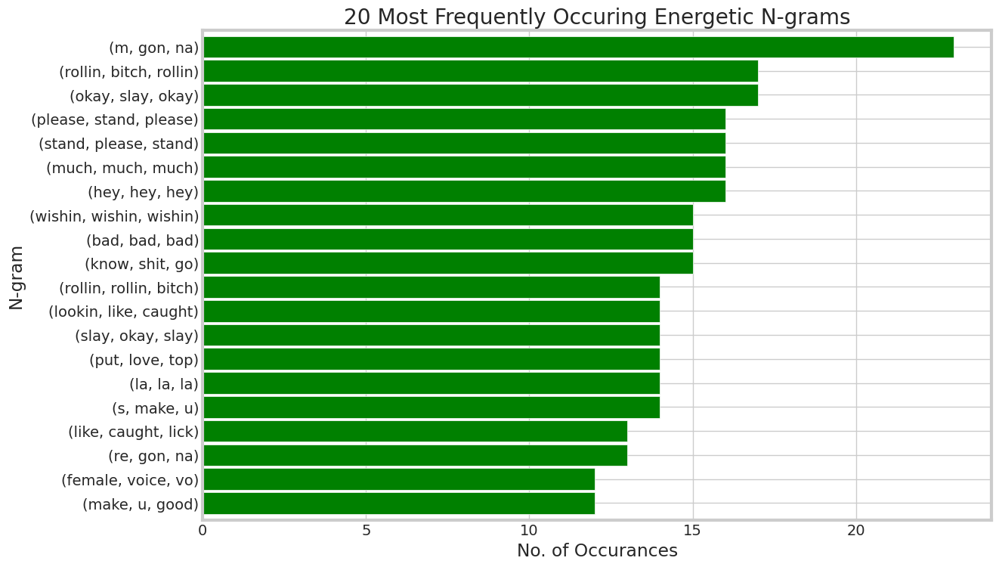

In [37]:
n_grams_energetic.sort_values().plot.barh(color='green', width=.9, figsize=(12, 8))
plt.title('20 Most Frequently Occuring Energetic N-grams')
plt.ylabel('N-gram')
plt.xlabel('No. of Occurances')

Text(0.5, 0, 'No. of Occurances')

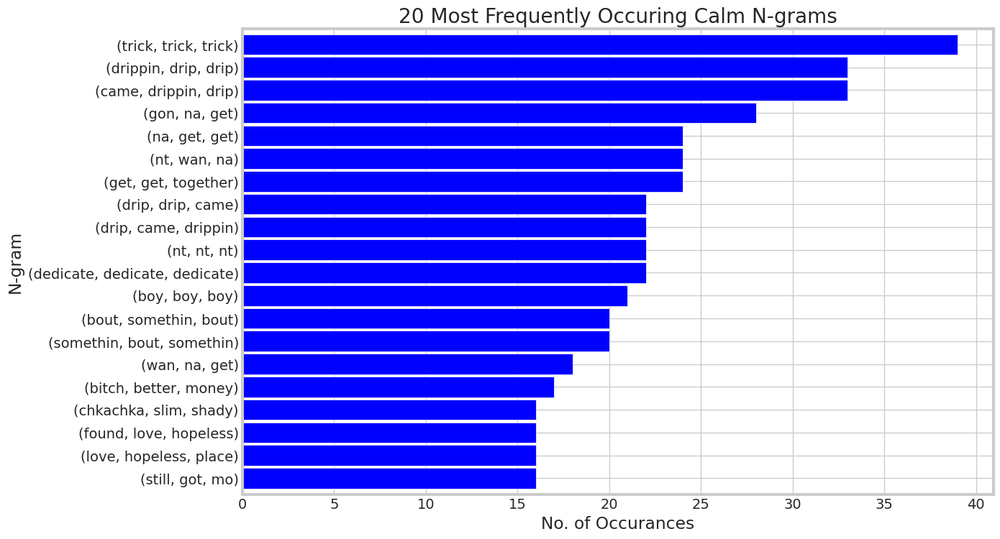

In [38]:
n_grams_calm.sort_values().plot.barh(color='blue', width=.9, figsize=(12, 8))
plt.title('20 Most Frequently Occuring Calm N-grams')
plt.ylabel('N-gram')
plt.xlabel('No. of Occurances')

Text(0.5, 0, 'No. of Occurances')

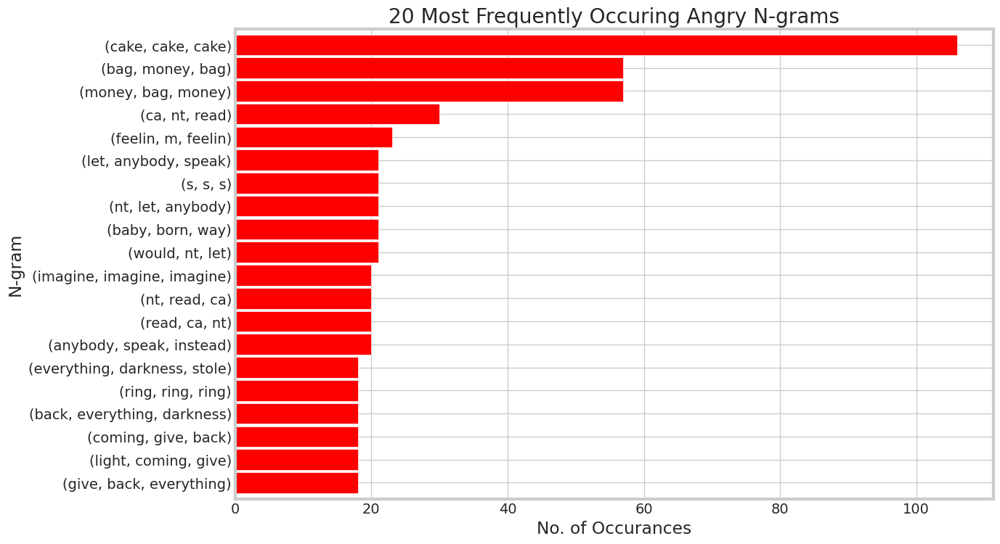

In [39]:
n_grams_angry.sort_values().plot.barh(color='red', width=.9, figsize=(12, 8))
plt.title('20 Most Frequently Occuring Angry N-grams')
plt.ylabel('N-gram')
plt.xlabel('No. of Occurances')

### Encoding Mood

*Encoding Technqiues*

There are numerous technqiues for encoding the mood column. 

These technqiues include:

**1) Bag of Words (BoW)** --> It is a technique that creates a set of vectors containing the count of word occurrences in the document (reviews). Additionally, Bag of Words vectors are easy to interpret.

**2) Term Frequency - Inverse Document Frequency (TF-IDF)** --> The TF-IDF model contains information on the more important words and the less important ones as well and it usually performs better in machine learning models.

There are other technqiues that won't be useful in this study; therefore, both technqiues will be used, tested and their results will be compared. 

#### Bag of Words (BoW)

In [40]:
from sklearn.feature_extraction.text import CountVectorizer

count_vect = CountVectorizer(max_features= 15000, ngram_range=(2,3))

cv_train_mood = count_vect.fit_transform(x_train) # Transformed train mood

cv_test_mood = count_vect.transform(x_test) # Transformed test mood

print('BOW_cv_train:',cv_train_mood.shape)
print('BOW_cv_test:',cv_test_mood.shape)

BOW_cv_train: (280, 15000)
BOW_cv_test: (121, 15000)


#### Term Frequency - Inverse Document Frequency (TF-IDF)

Reference: https://www.analyticsvidhya.com/blog/2021/09/creating-a-movie-reviews-classifier-using-tf-idf-in-python/

In [41]:
from sklearn.feature_extraction.text import TfidfVectorizer

# TF-IDF.
tf_idf = TfidfVectorizer()

# Applying TF-IDF to training data.
X_train_tf = tf_idf.fit_transform(x_train)
X_train_tf = tf_idf.transform(x_train)

# Checking the dimensions of our data.
print("n_samples: %d, n_features: %d" % X_train_tf.shape)


n_samples: 280, n_features: 7106


In [42]:
# Transforming test data into TF-IDF matrix.
X_test_tf = tf_idf.transform(x_test)

# Checking the dimensions of our data.
print("n_samples: %d, n_features: %d" % X_test_tf.shape)

n_samples: 121, n_features: 7106


#### Modelling using Naive Bayes Classifier

*Multinomial Naive Bayes Classifier - TF-IDF*

In [43]:
from sklearn.naive_bayes import MultinomialNB

mn_model = MultinomialNB()

# Using Multinomial Naive Bayes algoirthm in order to turn data into word counts in text.

In [44]:
mn_model.fit(X_train_tf, y_train)

# Fitting data into model.

MultinomialNB()

*Multinomial Naive Bayes Classifier - BoW*

In [45]:
from sklearn.naive_bayes import MultinomialNB

mn_model = MultinomialNB()

# Using Multinomial Naive Bayes algoirthm in order to turn data into word counts in text.

In [46]:
mn_model.fit(cv_train_mood, y_train)

# Fitting data into model.

MultinomialNB()

*Gaussian Naive Bayes Classifier - TF-IDF*

In [47]:
from sklearn.naive_bayes import GaussianNB

model = GaussianNB()

# Building a Gaussian Naive Bayes classifier in order to turn data into word counts in text.

In [48]:
model.fit(X_train_tf.toarray(), y_train)

# Fitting data into model.

GaussianNB()

*Gaussian Naive Bayes Classifier - BoW*

In [49]:
from sklearn.naive_bayes import GaussianNB

model = GaussianNB()

# Building a Gaussian Naive Bayes classifier in order to turn data into word counts in text.

In [50]:
model.fit(cv_train_mood.toarray(), y_train)

# Fitting data into model.

GaussianNB()

#### Modelling using Random Forest Classifier 

*Using TF-IDF*

In [51]:
from sklearn.ensemble import RandomForestClassifier

random_forest_clf = RandomForestClassifier(random_state = 7110)

# Using a Random Forest classifier in order to turn data into word counts in text.

In [52]:
random_forest_clf.fit(X_train_tf, y_train)

# Fitting data into model. 

RandomForestClassifier(random_state=7110)

*Using BoW*

In [53]:
from sklearn.ensemble import RandomForestClassifier

random_forest_clf = RandomForestClassifier(random_state = 7110)

# Using a Random Forest classifier in order to turn data into word counts in text.

In [54]:
random_forest_clf.fit(cv_train_mood, y_train)

# Fitting data into model. 

RandomForestClassifier(random_state=7110)

#### Evaluation for Naive Bayes Classifier

Reference: https://www.datacamp.com/tutorial/naive-bayes-scikit-learn

*Multinomial Naive Bayes Classifier - TF-IDF*

In [55]:
from sklearn.metrics import (accuracy_score, confusion_matrix, ConfusionMatrixDisplay, f1_score)

y_pred = mn_model.predict(X_test_tf)
accuracy = accuracy_score(y_pred, y_test)
f1 = f1_score(y_pred, y_test, average="weighted")

print("Accuracy:", accuracy)
print("F1 Score:", f1)

ValueError: ignored

*Multinomial Naive Bayes Classifier - BoW*

In [ ]:
from sklearn.metrics import (accuracy_score, confusion_matrix, ConfusionMatrixDisplay, f1_score)

y_pred = mn_model.predict(cv_test_mood)
accuracy = accuracy_score(y_pred, y_test)
f1 = f1_score(y_pred, y_test, average="weighted")

print("Accuracy:", accuracy)
print("F1 Score:", f1)

*Gaussian Naive Bayes Classifier - TF-IDF*

In [ ]:
from sklearn.metrics import (
    accuracy_score,
    confusion_matrix,
    ConfusionMatrixDisplay,
    f1_score,
)

y_pred = model.predict(X_test_tf.toarray())
accuracy = accuracy_score(y_pred, y_test)
f1 = f1_score(y_pred, y_test, average="weighted")

print("Accuracy:", accuracy)
print("F1 Score:", f1)

*Gaussian Naive Bayes Classifier - BoW*

In [ ]:
from sklearn.metrics import (
    accuracy_score,
    confusion_matrix,
    ConfusionMatrixDisplay,
    f1_score,
)

y_pred = model.predict(cv_test_mood.toarray())
accuracy = accuracy_score(y_pred, y_test)
f1 = f1_score(y_pred, y_test, average="weighted")

print("Accuracy:", accuracy)
print("F1 Score:", f1)

#### Evaluation for Random Forest Classifier

Reference: https://www.datacamp.com/tutorial/naive-bayes-scikit-learn

*Using TF-IDF*

In [ ]:
from sklearn.metrics import (
    accuracy_score,
    confusion_matrix,
    ConfusionMatrixDisplay,
    f1_score,
)

y_pred = random_forest_clf.predict(X_test_tf)
accuracy = accuracy_score(y_pred, y_test)
f1 = f1_score(y_pred, y_test, average="weighted")

print("Accuracy:", accuracy)
print("F1 Score:", f1)

*Using BoW*

In [ ]:
from sklearn.metrics import (
    accuracy_score,
    confusion_matrix,
    ConfusionMatrixDisplay,
    f1_score,
)

y_pred = random_forest_clf.predict(cv_test_mood)
accuracy = accuracy_score(y_pred, y_test)
f1 = f1_score(y_pred, y_test, average="weighted")

print("Accuracy:", accuracy)
print("F1 Score:", f1)

*Using BoW*

#### Leave one out cross-validation

Cross-validation techniques are numerous; however, the leave one out cross-validation technique has been deployed for our model due to the fact that it's more precise and accurate for small datasets (maximum 500 records). 

Reference: https://www.analyticsvidhya.com/blog/2021/11/top-7-cross-validation-techniques-with-python-code/

In [ ]:
from sklearn.datasets import load_iris
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import LeaveOneOut,cross_val_score
iris = load_iris()
X = iris.data
Y = iris.target
loo = LeaveOneOut()
tree = RandomForestClassifier(n_estimators = 10, max_depth = 5, n_jobs = -1)
score = cross_val_score(tree, X, Y, cv = loo)
print("Cross Validation Scores are {}".format(score))
print("Average Cross Validation score :{}".format(score.mean()))


#### Conculsion

The results of our model has shown the following:

***1) Deploying TF-IDF:*** 

The results have shown that the Random Forest classifier had the lowest overall Accuracy and F1 score compared to both the Naive Bayes classifiers. 

The Random Forest classifier had an accuracy = 17.4% and an F1 score = 19.9%.

Meanwhile, the Gaussian Naive Bayes classifier had the highest overall Accuracy and F1 score with an accuracy = 22.3% and an F1 score = 22.7%. 

***2) Deploying BoW:***

The results have shown that the Gaussian Naive Bayes classifier had the lowest overall Accuracy and F1 score compared to both the Multinomial Naive Bayes classifier and the Random Forest classifier. 

The Gaussian Naive Bayes classifier had an accuracy = 14.9% and an F1 score = 16%.

Meanwhile, the Multinomial Naive Bayes classifier had the highest overall Accuracy and F1 score with an accuracy = 22.3% and an F1 score = 23.4%.

As a result, when using TF-IDF as the encoding technqiue, Random Forest classifier had the best overall performance and results. Nonetheless, when using BoW as the encoding technique, the Multinomial Naive Bayes classifier has proved to have the best performance and results. 




Reference of the rest of the project: https://colab.research.google.com/github/GUC-DM/W2022/blob/main/lab_content/Lab_10_Complete.ipynb